In [1]:
import os
import numpy as np

In [2]:
val_losses = np.loadtxt('val_losses.txt')

In [3]:
n_epochs = len(val_losses)
epoch_ends = []
cur_pos = 0
for epoch in range(n_epochs):
    epoch_losses = np.loadtxt('losses_on_epoch{}.txt'.format(epoch + 1))
    if epoch == 0:
        train_losses = epoch_losses
    else:
        train_losses = np.concatenate([train_losses, epoch_losses])
    cur_pos += len(epoch_losses)
    epoch_ends.append(cur_pos)

In [4]:
import matplotlib.pyplot as plt
%matplotlib inline

In [5]:
def running_mean(x, n):
    cumsum = np.cumsum(x)
    return (cumsum[n:] - cumsum[:-n]) / n

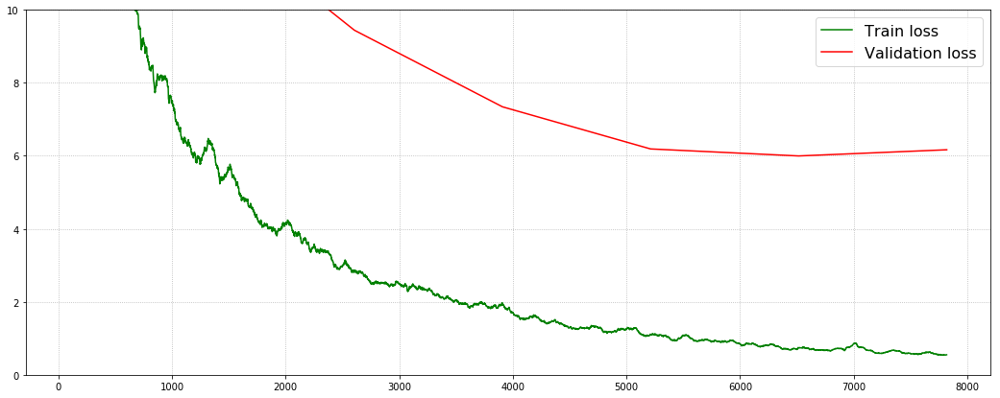

In [6]:
plt.figure(figsize=(18, 7))
plt.grid(ls=':')
plt.plot(np.arange(100, len(train_losses)), running_mean(train_losses, 100), color='g', label='Train loss')
plt.plot(epoch_ends, val_losses, color='r', label='Validation loss')
plt.ylim((0, 10))
plt.legend(fontsize=16)

## Визуализация работы нейросети

In [7]:
from keras.models import load_model

Using TensorFlow backend.


In [31]:
model = load_model('model_on_epoch6.hdf5')

In [9]:
import h5py
val_data_file = h5py.File('/home/kmouraviev/NYU_dataset_hdf5/validation_data_different_scenes.hdf5', 'r')
rgbs_val = np.array(val_data_file['data'][:1000])
depths_val = np.array(val_data_file['label'][:1000])
test_data_file = h5py.File('/home/kmouraviev/NYU_dataset_hdf5/validation_data_different_collections.hdf5', 'r')
rgbs_test = np.array(test_data_file['data'][:1000])
depths_test = np.array(test_data_file['label'][:1000])

In [10]:
print(rgbs_val.shape, depths_val.shape)
print(rgbs_test.shape, depths_test.shape)

(1000, 384, 512, 3) (1000, 384, 512)
(1000, 384, 512, 3) (1000, 384, 512)


In [14]:
rgbs_val_sample = rgbs_val[:50]
depths_val_sample = depths_val[:50]
val_prediction = model.predict(rgbs_val_sample)

In [15]:
print(val_prediction.min(), val_prediction.max())

-19.401812 25.065186


In [17]:
print('val MSE:', np.mean((val_prediction - depths_val_sample) ** 2))

val MSE: 5.364198123012554


In [18]:
import matplotlib.pyplot as plt
%matplotlib inline

In [19]:
def unpreprocess(img):
    img_min = -123
    img_max = 151
    return (img - img_min) / (img_max - img_min)

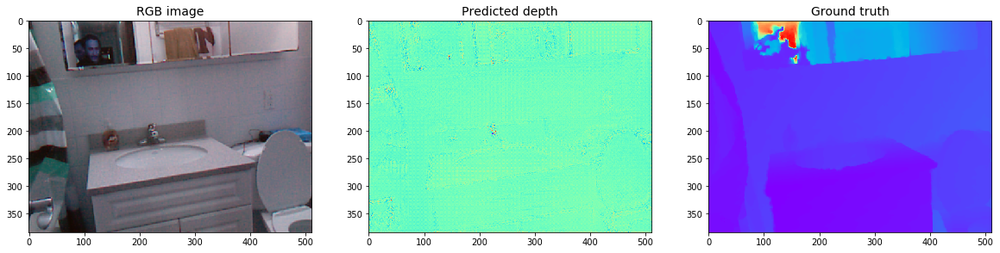

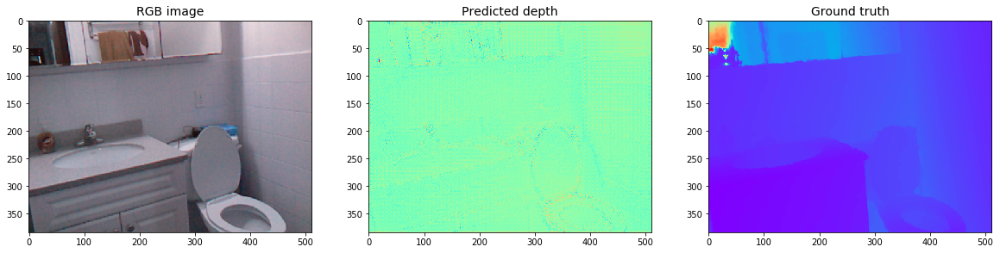

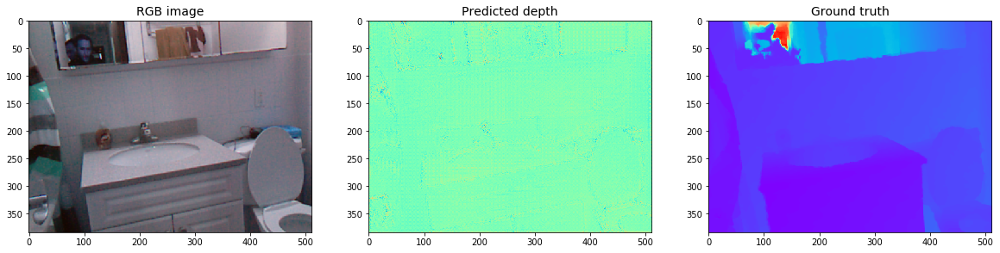

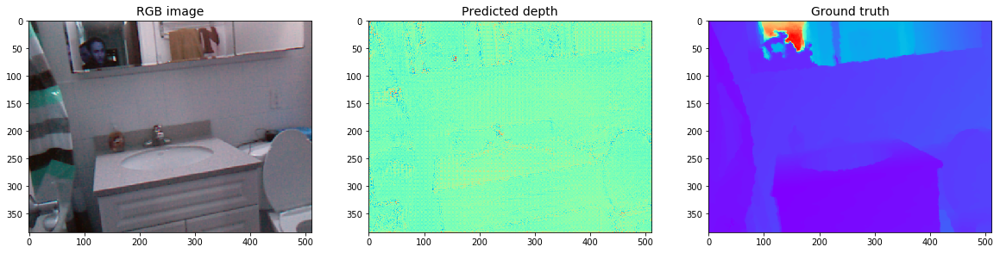

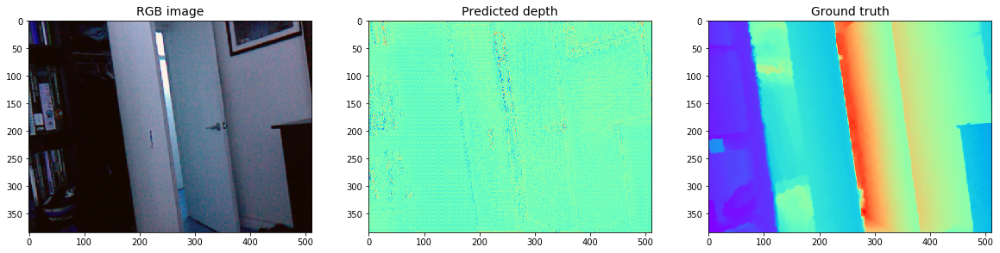

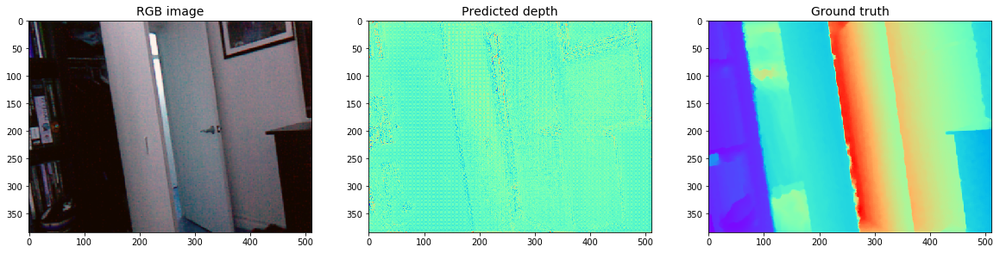

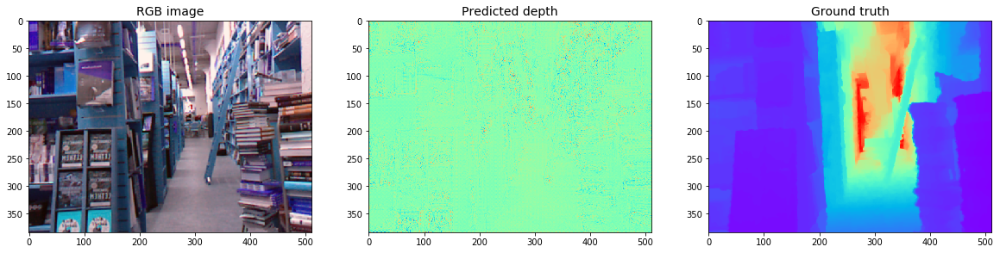

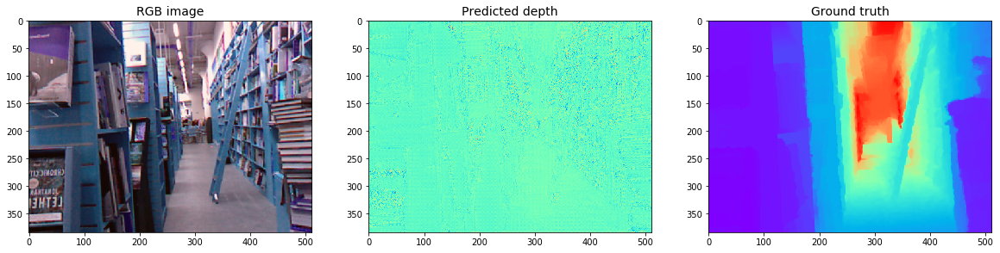

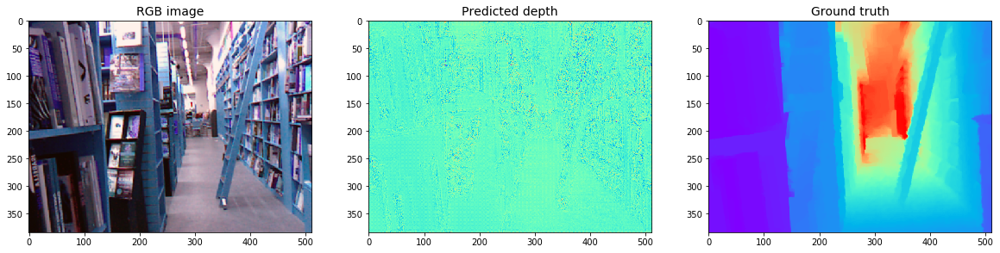

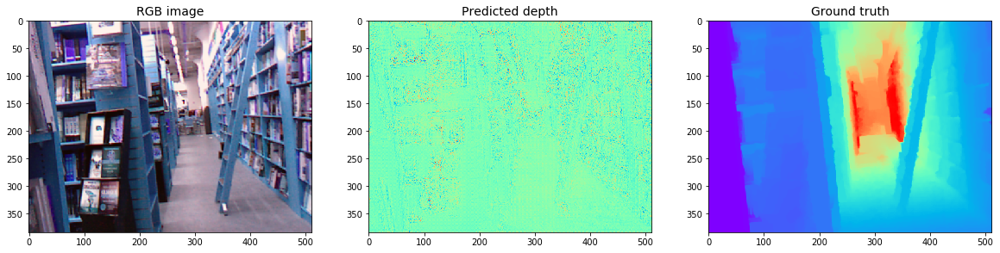

In [22]:
for i in range(0, 50, 5):
    plt.figure(figsize=(20, 5))
    plt.subplot(1, 3, 1)
    plt.title('RGB image', fontsize=14)
    plt.imshow(unpreprocess(rgbs_val[i]))
    plt.subplot(1, 3, 2)
    plt.title('Predicted depth', fontsize=14)
    plt.imshow(val_prediction[i] / 10, cmap='rainbow')
    plt.subplot(1, 3, 3)
    plt.title('Ground truth', fontsize=14)
    plt.imshow(depths_val[i] / 10, cmap='rainbow')

In [23]:
train_data_file = h5py.File('/home/kmouraviev/NYU_dataset_hdf5/train_data_fullsize_small.hdf5')
rgbs_train = np.array(train_data_file['data'][:10000])
depths_train = np.array(train_data_file['label'][:10000])

In [24]:
print(rgbs_train.min(), rgbs_train.max())

-122.68 150.061


In [25]:
rgbs_train_sample = rgbs_train[::100]
depths_train_sample = depths_train[::100]

In [32]:
train_prediction = model.predict(rgbs_train_sample)

In [33]:
print('MSE:', np.mean((train_prediction - depths_train_sample) ** 2))

MSE: 7.115740107471995


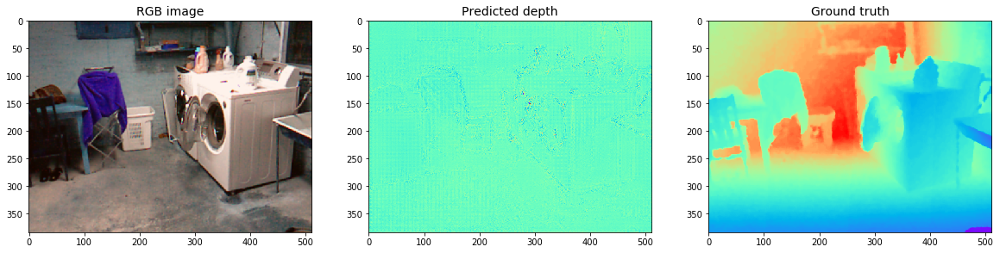

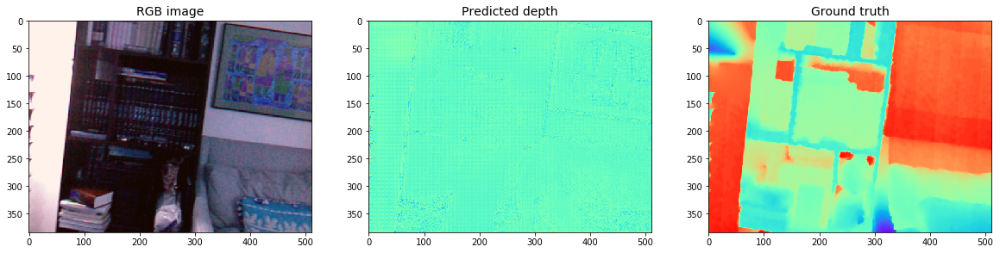

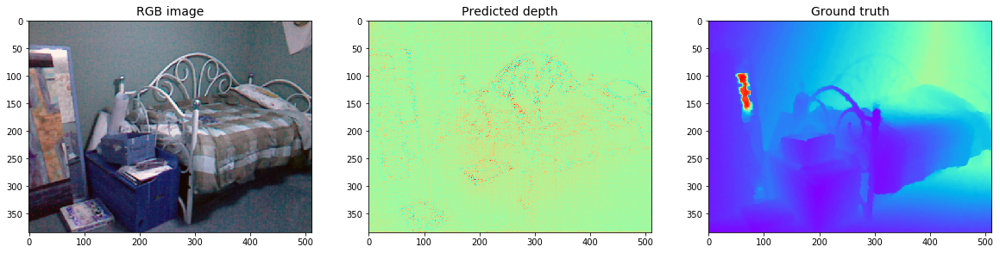

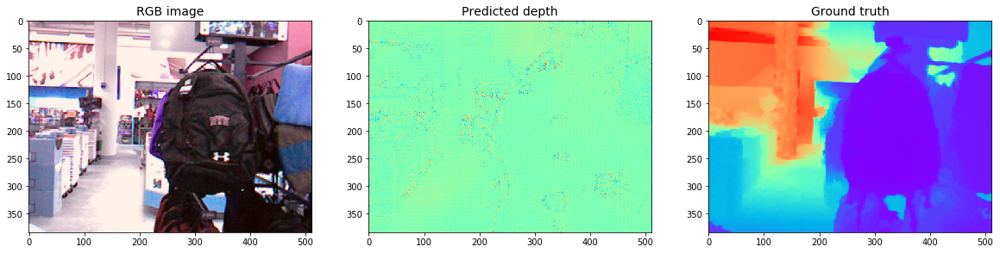

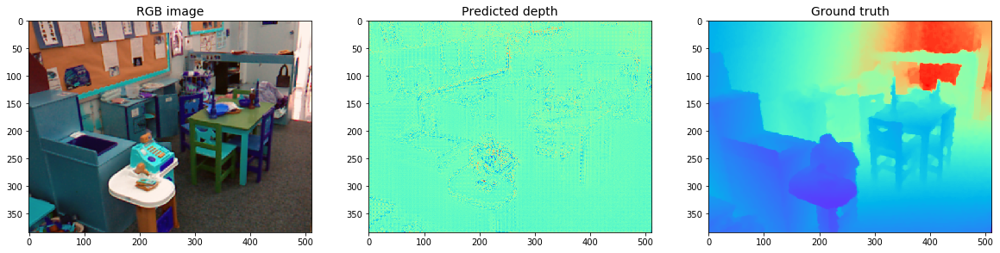

...

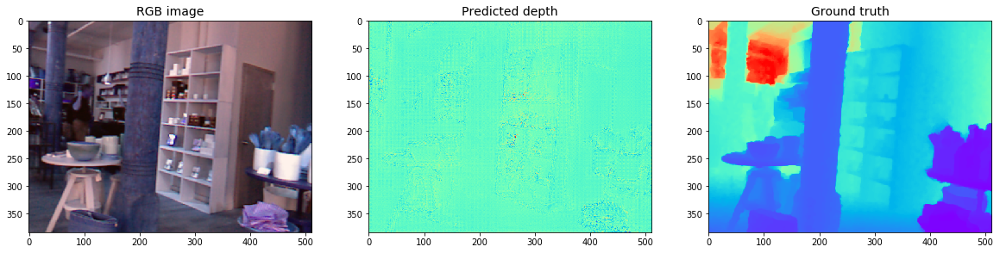

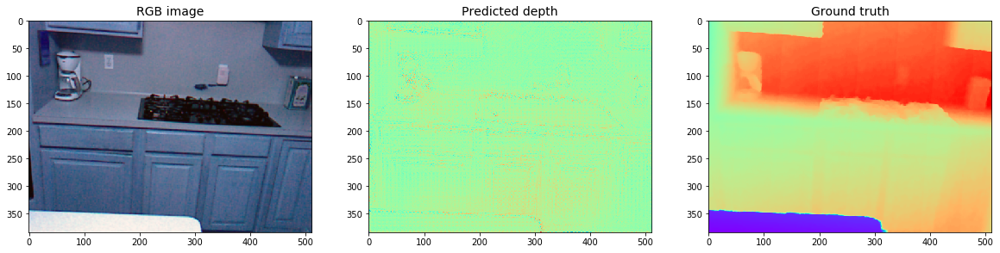

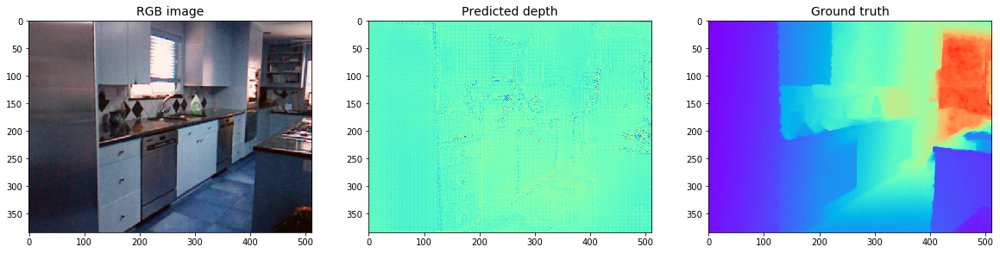

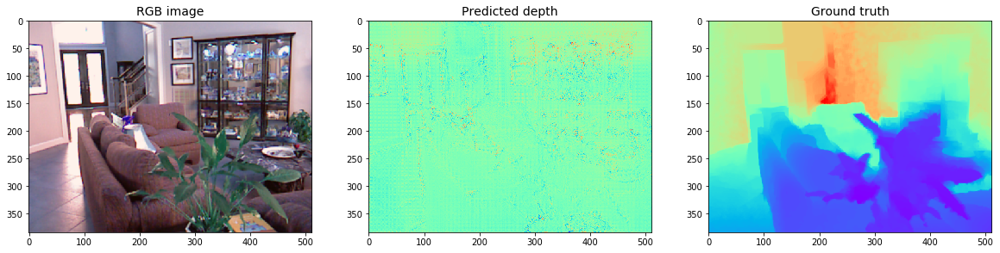

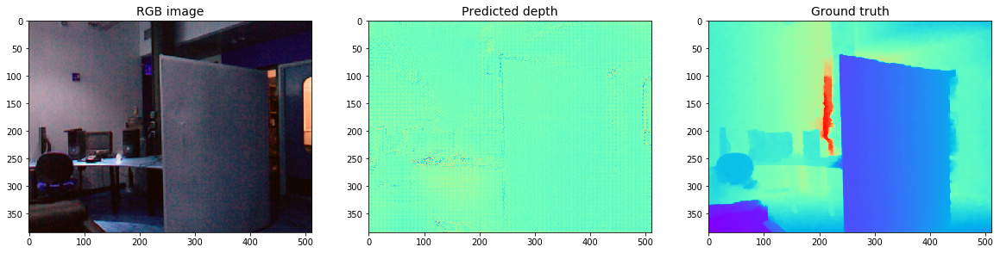

In [34]:
for i in range(20):
    plt.figure(figsize=(20, 5))
    plt.subplot(1, 3, 1)
    plt.title('RGB image', fontsize=14)
    plt.imshow(unpreprocess(rgbs_train_sample[i]))
    plt.subplot(1, 3, 2)
    plt.title('Predicted depth', fontsize=14)
    plt.imshow(train_prediction[i] / 10, cmap='rainbow')
    plt.subplot(1, 3, 3)
    plt.title('Ground truth', fontsize=14)
    plt.imshow(depths_train_sample[i] / 10, cmap='rainbow')